<a href="https://colab.research.google.com/github/nataliasbsg/Transfer_Learning_Animals/blob/main/src/Resdes_Entrenadas/Inception-Resnet_V2/RedGeneral_Inception_Resnet_V2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Importación de archivos desde drive
from google.colab import drive

# Tratamiento de imágenes
import numpy as np
import cv2
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import shutil
from PIL import Image
import zipfile

# Librerías para la red
import tensorflow as tf
import tensorflow_datasets as tensorflow_datasets
import tensorflow_hub as hub
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow import keras

# Interacción con ejemplos en URLs
import requests
from io import BytesIO

from datetime import datetime


# Lectura de imágenes desde Drive
Se accede a las imagenes contenidas en Drive. En este caso hay tres niveles de carpetas:
1. Base de Datos general. Una sola carpeta que contiene todas las familias de animales que se quieren estudiar. Por ejemplo: "Base de datos de animales".
2. Conjunto de carpetas de familias de animales que a su vez contienen las carpetas de especies animales de la misma familia (categories). Por ejemplo:  dentro de "Base de datos de animales" encontraríamos "Cánidos" y "Felinos".
3. Conjunto de carpetas de especies animales (subcategories). Contienen las imagenes con las que se va a trabajar. Por ejemplo: dentro de "Felinos" encontraríamos "Linces" y "Gatos".


Se estudiará la pertenencia a las familias de cada imagen y para ello se numerará la cantidad de imágenes de cada familia (no de cada especie) y se hará una copia de las imágenes clasificadas en la máquina virtual.

En este caso las familias y las especies de cada una son las siguientes:
0. Cánidos: zorros.
1. Cérvidos: ciervos y gamos.
2. Felinos: gatos y linces.
3. Herpéstidos: meloncillos.
4. Lepóridos: conejos y liebres.
5. Mustélidos: tejones.
6. Suidos: jabalíes.
7. Vivérridos: ginetas.

In [ ]:
# !rm -r /content/dataset
# !rm -r /content/logs
# !rm -r /content/test

In [ ]:
# !rm -r /content/drive

In [ ]:
# # Se accede a drive y se piden los permisos al usuario para trabajar en su cuenta
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
!wget --no-check-certificate \
    "https://github.com/nataliasbsg/Transfer_Learning_Animals/archive/refs/heads/master.zip" \
    -O "/tmp/Transfer_Learning_Animals.zip"

zip_ref = zipfile.ZipFile('/tmp/Transfer_Learning_Animals.zip', 'r') #Opens the zip file in read mode
zip_ref.extractall('/tmp') #Extracts the files into the /tmp folder
zip_ref.close()

--2022-07-10 19:12:30--  https://github.com/nataliasbsg/Transfer_Learning_Animals/archive/refs/heads/master.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/nataliasbsg/Transfer_Learning_Animals/zip/main [following]
--2022-07-10 19:12:31--  https://codeload.github.com/nataliasbsg/Transfer_Learning_Animals/zip/main
Resolving codeload.github.com (codeload.github.com)... 20.205.243.165
Connecting to codeload.github.com (codeload.github.com)|20.205.243.165|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘/tmp/Transfer_Learning_Animals.zip’

/tmp/Transfer_Learn     [               <=>  ]   1.75G  17.6MB/s    in 1m 42s  

2022-07-10 19:14:13 (17.5 MB/s) - ‘/tmp/Transfer_Learning_Animals.zip’ saved [1882791598]



In [ ]:
# Carpeta raiz
dir = '/tmp/Transfer_Learning_Animals-main'

# Se carga la base de datos de imagenes que se quieren clasificar
dir_train = dir + '/BD_Familia_299'

In [ ]:
# Dirección de la carpeta contenedora con la que se quiere trabajar
# dir_train = '../content/drive/MyDrive/Colab Notebooks/BD_Familia' # path to directory with the images

# Se leen las carpetas contenidas en la direccion anterior y se ordenan y guardan en categories
categories = sorted(os.listdir(dir_train))
print('Las categorias de familias animales son:', categories)
categories_folders = [os.path.join(dir_train, categorie) for categorie in categories]

Las categorias de familias animales son: ['Canidos', 'Cervidos', 'Felinos', 'Herpestidos', 'Leporidos', 'Mustelidos', 'Suidos', 'Viverridos']


In [ ]:
# Se inicializan variables 
num_images = [] # Guardara el numero de imagenes de cada categoria
subcategories = [] # Guardara las subcategorias de cada categoria (subcarpetas)

for categorie in categories:
  num_images_sub = 0
  # Se leen las subcarpetas de las carpetas (las especies de las familias)
  subcategories.append(sorted(os.listdir(f'{dir_train}/{categorie}')))

  try:
    # Se crean directorios en la maquina virtual
    os.makedirs("dataset/{}".format(categorie))
  except:
    pass

  for subcategorie in subcategories[categories.index(categorie)]:
    num_images_sub = num_images_sub + len(os.listdir(f'{dir_train}/{categorie}/{subcategorie}'))

  # Se guarda el numero de imagenes de cada categoria (familia)
  num_images.append(num_images_sub)

print('El numero de imagenes de cada categoria es:', num_images)

# Se establece un limite con la carpeta con el menor numero de imagenes 
limit_image = min(num_images)
print('Se utilizarán', limit_image, 'imagenes de cada categoria')


El numero de imagenes de cada categoria es: [2310, 2862, 3878, 1929, 2712, 5087, 1794, 1783]
Se utilizarán 1783 imagenes de cada categoria


In [ ]:
# Se limita el numero de imagenes para equilibrar las clases
for i, categorie in enumerate(categories):
  for subcategorie in subcategories[i]:
    carpeta_fuente = f'{dir_train}/{categorie}/{subcategorie}'
    carpeta_destino = '/content/dataset/{}'.format(categorie)
    imagenes = [img for j, img in enumerate(os.listdir(carpeta_fuente)) if j<limit_image/len(subcategories[i])]
    for nombreimg in imagenes:
      path = os.path.join(f'{dir_train}/{categorie}/{subcategorie}', nombreimg)
      shutil.copy(path, carpeta_destino + '/' + nombreimg)

Found 11367 images belonging to 8 classes.
Found 2835 images belonging to 8 classes.


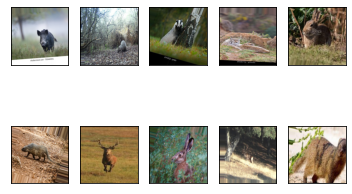

In [ ]:
#Crear el dataset generador
datagen = ImageDataGenerator(
    rescale = 1. / 255,
    rotation_range = 20,
    zoom_range = 0.2,
    width_shift_range = 0.05,
    height_shift_range = 0.05,
    shear_range = 0.05,
    horizontal_flip=True,
    fill_mode = 'nearest',
    validation_split = 0.2 #20% para pruebas
)

#Generadores para sets de entrenamiento y pruebas
data_gen_entrenamiento = datagen.flow_from_directory('/content/dataset', target_size=(299,299),
                                                     batch_size=32, shuffle=True, subset='training')
data_gen_pruebas = datagen.flow_from_directory('/content/dataset', target_size=(299,299),
                                                     batch_size=32, shuffle=True, subset='validation')

#Imprimir 10 imagenes del generador de entrenamiento
for imagen, etiqueta in data_gen_entrenamiento:
  for i in range(10):
    plt.subplot(2,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i])
  break
plt.show()


In [ ]:
url = "https://tfhub.dev/google/imagenet/inception_resnet_v2/classification/5"
inception_resnet_v2 = hub.KerasLayer(url, input_shape=(299,299,3))

In [ ]:
#Congelar el modelo descargado
inception_resnet_v2.trainable = False

In [ ]:
modelo = tf.keras.Sequential([
    inception_resnet_v2,
    tf.keras.layers.Dense(len(categories), activation='softmax')
])

In [ ]:
modelo.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              55875273  
                                                                 
 dense (Dense)               (None, 8)                 8016      
                                                                 
Total params: 55,883,289
Trainable params: 8,016
Non-trainable params: 55,875,273
_________________________________________________________________


In [ ]:
log_dir = "logs/fit/"
checkpoint_filepath = 'tmp/checkpoint'
callback = [tf.keras.callbacks.ModelCheckpoint (filepath=checkpoint_filepath,
                                                save_weights_only=True,
                                                monitor='val_accuracy',
                                                mode='max',
                                                save_best_only=True),
                                                
            tf.keras.callbacks.EarlyStopping (monitor='val_accuracy',
                                              min_delta=0,
                                              verbose=1, 
                                              patience=10),
            
            tf.keras.callbacks.TensorBoard (log_dir=log_dir, 
                                            histogram_freq=1),
            
            tf.keras.callbacks.BackupAndRestore (backup_dir="tmp")
            ]

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
#Compilar modelo
modelo.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
EPOCAS = 30

historial = modelo.fit(
    data_gen_entrenamiento, epochs=EPOCAS, callbacks=[callback], batch_size=32,
    validation_data=data_gen_pruebas
)

Epoch 1/30
356/356 [==============================] - 368s 966ms/step - loss: 0.2312 - accuracy: 0.9301 - val_loss: 0.1311 - val_accuracy: 0.9626
Epoch 2/30
356/356 [==============================] - 332s 931ms/step - loss: 0.1169 - accuracy: 0.9623 - val_loss: 0.1109 - val_accuracy: 0.9679
Epoch 3/30
356/356 [==============================] - 329s 925ms/step - loss: 0.1089 - accuracy: 0.9649 - val_loss: 0.1152 - val_accuracy: 0.9675
Epoch 4/30
356/356 [==============================] - 332s 931ms/step - loss: 0.0946 - accuracy: 0.9672 - val_loss: 0.1232 - val_accuracy: 0.9668
Epoch 5/30
356/356 [==============================] - 335s 942ms/step - loss: 0.0902 - accuracy: 0.9709 - val_loss: 0.1129 - val_accuracy: 0.9728
Epoch 6/30
356/356 [==============================] - 332s 932ms/step - loss: 0.0850 - accuracy: 0.9721 - val_loss: 0.1245 - val_accuracy: 0.9647
Epoch 7/30
356/356 [==============================] - 332s 932ms/step - loss: 0.0843 - accuracy: 0.9729 - val_loss: 0.1239 -

In [ ]:
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

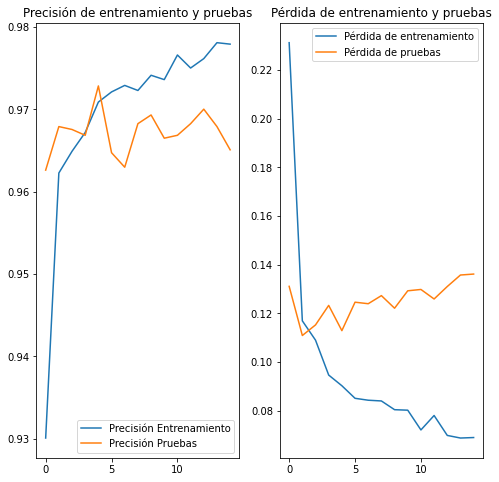

El valor máximo de la precisión en pruebas se da en la época: 4
Donde el valor de los parámetros principales son los siguientes:
El valor máximo de la precisión en pruebas es: 0.9728
El valor de pérdidas en pruebas es: 0.1129
El valor de precisión en entrenamiento es: 0.9709
El valor de pérdidas en  entrenamiento es: 0.0902


In [ ]:
#Mostrar resultados con graficas de precisión
acc = historial.history['accuracy']
val_acc = historial.history['val_accuracy']

loss = historial.history['loss']
val_loss = historial.history['val_loss']

rango_epocas = range(len(val_loss))

plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(rango_epocas, acc, label='Precisión Entrenamiento')
plt.plot(rango_epocas, val_acc, label='Precisión Pruebas')
plt.legend(loc='lower right')
plt.title('Precisión de entrenamiento y pruebas')

plt.subplot(1,2,2)
plt.plot(rango_epocas, loss, label='Pérdida de entrenamiento')
plt.plot(rango_epocas, val_loss, label='Pérdida de pruebas')
plt.legend(loc='upper right')
plt.title('Pérdida de entrenamiento y pruebas')
plt.show()

max_val_acc = (max(val_acc))
index = val_acc.index(max_val_acc)

print('El valor máximo de la precisión en pruebas se da en la época:', index)
print('Donde el valor de los parámetros principales son los siguientes:')
print('El valor máximo de la precisión en pruebas es: {:.4f}'.format(val_acc [index]))
print('El valor de pérdidas en pruebas es: {:.4f}'.format(val_loss [index]))
print('El valor de precisión en entrenamiento es: {:.4f}'.format(acc [index]))
print('El valor de pérdidas en  entrenamiento es: {:.4f}'.format(loss [index]))

In [ ]:
#Categorizar una imagen de internet
from PIL import Image
import requests
from io import BytesIO
import cv2

def categorizar(url):
  respuesta = requests.get(url)
  img = Image.open(BytesIO(respuesta.content))
  img = np.array(img).astype(float)/255

  img = cv2.resize(img, (299,299))
  prediccion = modelo.predict(img.reshape(-1, 299, 299, 3))
  return np.argmax(prediccion[0], axis=-1)


In [ ]:
# #Crear la carpeta para exportarla a TF Serving
# !mkdir -p /content/carpeta_salida/modelo_animales/1
# #Guardar el modelo en formato SavedModel
# modelo.save('/content/carpeta_salida/modelo_animales/1')
# #Hacerlo un zip para bajarlo y usarlo en otro lado
# !zip -r /content/drive/MyDrive/carpeta_salida/modelo_animales.zip /content/carpeta_salida/modelo_animales/1

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
modelo.save('/content/drive/MyDrive/clasificador_animales.h5')

In [ ]:
# !rm -r /content/drive/MyDrive/carpeta_salida/modelo_animales

In [ ]:
# modelo = tf.keras.models.load_model('/content/drive/MyDrive/carpeta_salida/modelo_animales/clasificador_animales.h5',custom_objects={'KerasLayer':hub.KerasLayer})

# Resultados de validacion

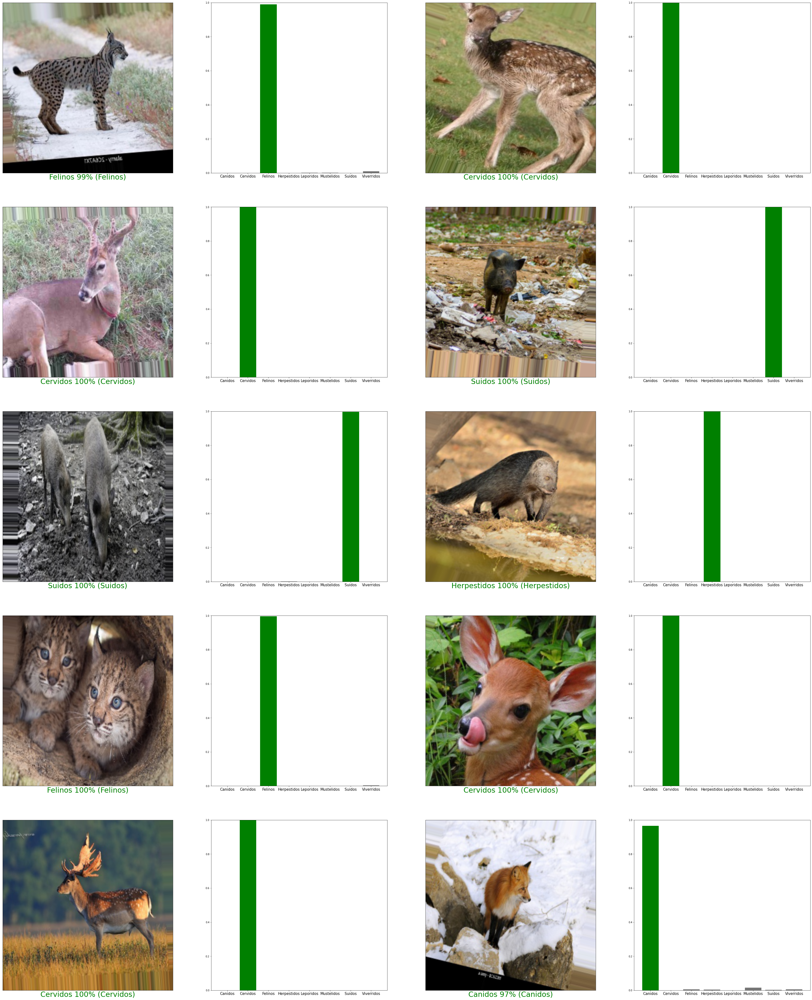

In [ ]:
#Pintar 30 imagenes con predicciones, y marcar si son correctas (verde) o incorrectas (roja)
predicciones_prueba = []
imagenes_prueba= []
etiquetas_prueba= []
color = []

filas = 5
columnas = 2
num_imagenes = filas*columnas

for imagen_prueba, etiqueta_prueba in data_gen_pruebas:
  for i in range(num_imagenes):
      imagen_prueba[i] = np.array(imagen_prueba[i]).astype(float)
      imagenes_prueba.append (imagen_prueba[i])
      etiquetas_prueba.append (etiqueta_prueba[i])
      predicciones_prueba.append(modelo.predict(imagenes_prueba[i].reshape(-1, 299, 299, 3)))
      etiqueta_prediccion = int(np.argmax(predicciones_prueba[i], axis=-1))
      etiqueta_real = np.argmax(etiqueta_prueba[i])
      if etiqueta_prediccion == etiqueta_real: 
        color.append ('green')
      else:
        color.append ('red')
  break
  plt.show()

  
def graficar_imagen(i, predicciones_prueba, etiquetas_reales, imagenes):
  arr_predicciones, etiqueta_real, img = predicciones_prueba[i], etiquetas_reales[i], imagenes[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(img)
  etiqueta_prediccion = int(np.argmax(predicciones_prueba[i], axis=-1))
  etiqueta_real = np.argmax(etiqueta_real)

  plt.xlabel("{} {:2.0f}% ({})".format(categories[etiqueta_prediccion],
                                100*np.max(arr_predicciones),
                                categories[etiqueta_real]),
                                color=color[i], fontsize=30)
  
def graficar_valor_arreglo(i, predicciones_prueba, etiqueta_real):
  arr_predicciones, etiqueta_real = predicciones_prueba[i], etiqueta_real[i]
  plt.grid(False)
  # plt.xticks([])
  # plt.yticks([])
  plt.xticks(fontsize=15)
  grafica = plt.bar(categories, arr_predicciones[0], color="#777777")
  plt.ylim([0, 1]) 
  etiqueta_real = np.argmax(etiqueta_real)
  etiqueta_prediccion = int(np.argmax(arr_predicciones[0], axis=-1))
  grafica[etiqueta_real].set_color('green')
  grafica[etiqueta_prediccion].set_color(color[i])


plt.figure(figsize=(30*columnas, 15*filas))
for i in range(num_imagenes):
  plt.subplot(filas, 2*columnas, 2*i+1)
  graficar_imagen(i, predicciones_prueba, etiquetas_prueba, imagenes_prueba)
  plt.subplot(filas, 2*columnas, 2*i+2)
  graficar_valor_arreglo(i, predicciones_prueba, etiquetas_prueba)